# Exploratory Data Analytics on Olympics data

### Introduction:

Exploratory Data Analysis, or EDA, is a major step in any Data Analysis or Data Science project. EDA is the process of looking into the dataset to discover patterns, and abnormalities (outliers), and form hypothesis based on our understanding of the dataset. EDA involves generating summary statistics for numerical data in the dataset and generating various graphical representations to understand the data better.

### Importance of Exploratory Data Analytics:

The primary purpose of this analysis is to examine the facts before making any assumptions, finding errors, improving understanding, identifying outliers or anomalies, and determining relationships between the datasets variables are all aided by this information.

These are useful for locating reliable results, appropriate outcomes, and corporate goals.It also verifies whether the analysts are posing the proper queries about the dataset. Finding the solutions to the categorical variables, confidence intervals, and standard deviations that are contained in the data is helpful.

### Data collection

This is a historical dataset on the modern Olympic Games, including all the Games from Athens 1896 to Rio 2016. This data is taken from www.sports-reference.com. 

### Data description

This dataset contains 271116 rows and 15 columns. Each row corresponds to an individual athlete competing in an individual Olympic event (athlete-events). Each row is an athlete-event. The ID column can be used to uniquely identify athletes, since some athletes have the same name.
<br>1. ID - Unique number for each athlete;
<br>2. Name - Athlete's name;
<br>3. Sex - M or F;
<br>4. Age - Integer;
<br>5. Height - In centimeters;
<br>6. Weight - In kilograms;
<br>7. Team - Team name;
<br>8. NOC - National Olympic Committee 3-letter code;
<br>9. Games - Year and season;
<br>10. Year - Integer;
<br>11. Season - Summer or Winter;
<br>12. City - Host city;
<br>13. Sport - Sport;
<br>14. Event - Event;
<br>15. Medal - Gold, Silver, Bronze, or NA.

This dataset provides an opportunity to ask questions about how the Olympics have evolved over time, including questions about the participation and performance of women, different nations, and different sports and events.

## Index of Content

<br>1. Importing the modules.
<br>2. Data importing.
<br>3. Collecting information about the dataset.
<br>4. Data Cleaning
<br>5. Medals won by Indian Athletes
<br>6. Sports in which India has won medals over the years
<br>7. Countries with most number of Gold Medals 
<br>8. Participation of Male and Female athletes over the years
<br>9. Relationship between height and weight in different Sports
<br>10.Top 3 male athletes with most number of medals
<br>11. Top 3 female athletes with most number of medals
<br>12. Conclusion

### 1. Importing the modules.

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.colors import ListedColormap

### 2. Data importing.

In [38]:
olympics = pd.read_csv("C:/Users/Prath/OneDrive/Documents/Datasets/Olympics.csv")
olympics.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


### 3. Collecting Information about the dataset

We will be using the describe and info functions to collect statistical information, datatypes, column names and other information.

In [39]:
# To know the number of rows and columns in the dataset

print(olympics.shape)

(271116, 15)


In [40]:
# To get the statistics for numerical features

olympics.describe().style.background_gradient(cmap='Purples',axis=None)

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.335936,70.702393,1978.378480
std,39022.286345,6.393561,10.539154,14.348020,29.877632
min,1.000000,10.000000,2.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


From the above description of the data, the following observation can be made
- The minimum and maximum height of the athletes are given as 2 and 226 respectively. An athlete with height 2 cm is impossible to exist. This is clearly a mistake and can be treated as an outlier

In [41]:
olympics=olympics[(olympics["Height"]!=2) & (olympics["Height"]!=12) & (olympics["Height"]!=30) & (olympics["Height"]!=54)]

In [42]:
# To check for if there are null values

olympics.isnull().values.any()

True

In [45]:
olympics.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

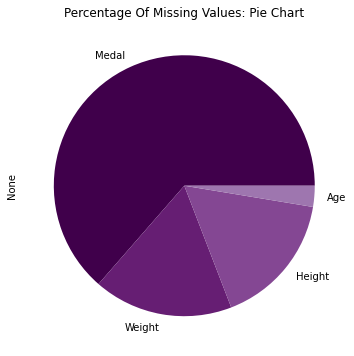

In [118]:
missing=100*(olympics.isnull().sum().sort_values(ascending=False)/len(olympics))
plt.title("Percentage Of Missing Values: Pie Chart")
missing.plot(figsize=(12,6),kind="pie",cmap=("PRGn"));

The Medal column has the maximum number of null values because the dataset contains the information of all the olympic participants and there are only three medals for the winners. Therefore the participants with no medals are taken to be null values.

### 4. Data Cleaning

Now let us fill all the null values in columns Age, Height and Weight with the mean column parameters:

In [9]:
olympics["Age"].fillna(value=olympics["Age"].mean(),inplace=True)
olympics["Height"].fillna(value=olympics["Height"].mean(),inplace=True)
olympics["Weight"].fillna(value=olympics["Weight"].mean(),inplace=True)

The Medal column has only 3 values i.e. Gold, Silver and Bronze. The rest of the participants with no medals have null values in the Medal clumn. We have to replace the null values with "No Medals"

In [10]:
olympics["Medal"].fillna(value="No Medal",inplace=True)

In [11]:
olympics.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Games     0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
dtype: int64

In [12]:
#Checking for duplicate values(identical rows)

olympics.duplicated().sum()

1385

Let us remove the duplicate values by using .drop_duplicates. method. The argumentkeep = 'First'will ensure that pandas deletes all the duplicate rows, but for the first one.

In [13]:
olympics.drop_duplicates(keep='first',inplace=True)
olympics.duplicated().sum()

0

We have successfully cleaned the data by replacing the null values and removing the duplicate values.

Even after cleaning the data, another anomaly exists in the data. The team sports like Hockey, Basketball and others are being awarded with a single medal for the entire team. But, in our analysis, it is taken as individual medals. Even though India has not won 138 gold medals individually, it is taken as the sum of the medals won by the Indian players including team sports.
But this is the case with all the countries, so should not make much difference to our analysis.

### 5. Medals won by Indian Athletes

In [14]:
print(olympics['Team'].value_counts()["India"])

1400


From the above data we can conclude that since 1896 to 2016, 1400 athletes particpated from India including both Winter and Summer olympics

In [15]:
#To find the medals won by Indian athletes
I=olympics.loc[(olympics["Team"] == "India") & (olympics["Medal"]!="No Medal")]
I.head().style.background_gradient(cmap="Purples",axis=None)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
4732,2699,Shaukat Ali,M,30.000000,175.338796,70.702282,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold
4736,2703,Syed Mushtaq Ali,M,22.000000,165.000000,61.000000,India,IND,1964 Summer,1964,Summer,Tokyo,Hockey,Hockey Men's Hockey,Gold
5032,2864,Richard James Allen,M,25.000000,172.000000,70.702282,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold
5033,2864,Richard James Allen,M,30.000000,172.000000,70.702282,India,IND,1932 Summer,1932,Summer,Los Angeles,Hockey,Hockey Men's Hockey,Gold
5034,2864,Richard James Allen,M,34.000000,172.000000,70.702282,India,IND,1936 Summer,1936,Summer,Berlin,Hockey,Hockey Men's Hockey,Gold


Gold      138
Bronze     40
Silver     19
Name: Medal, dtype: int64

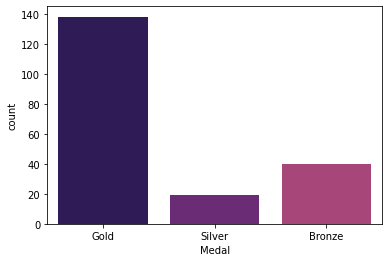

In [116]:
sns.set_palette("magma",5)
Medals=I['Medal'].value_counts().sort_values(ascending=False)
z=sns.countplot(data=I, x='Medal')
Medals

##### gold = I[I['Medal']=='Gold'].reset_index(drop=True)
G=gold['Year'].value_counts()
silver=I[I['Medal']=='Silver'].reset_index(drop=True)
S=silver['Year'].value_counts()
bronze=I[I['Medal']=='Bronze'].reset_index(drop=True)
B=bronze['Year'].value_counts()
sns.set_palette("magma",10)

fig, axs = plt.subplots(1, 3,figsize=(20, 6))
sns.barplot(x=G.index,y=G,ax=axs[0]).set_title('Gold Medals')
sns.barplot(x=S.index,y=S,ax=axs[1]).set_title('Silver Medals')
sns.barplot(x=B.index,y=B,ax=axs[2]).set_title('Bronze Medals')
plt.show()

### 6. Sports in which India has won medals over the years

Hockey           173
Alpinism           7
Wrestling          5
Shooting           4
Boxing             2
Badminton          2
Athletics          2
Weightlifting      1
Tennis             1
Name: Sport, dtype: int64


<AxesSubplot:ylabel='Sport'>

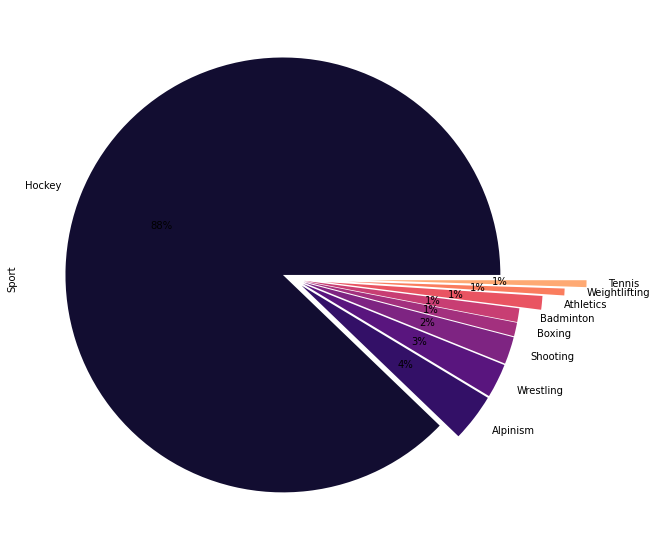

In [114]:
Sports=I['Sport'].value_counts().sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(10,10))
print(Sports)
explode = (0.05, 0.05, 0.05,0.05, 0.05, 0.05, 0.15, 0.25, 0.35)
sns.set_palette("magma",10)
Sports.plot(kind='pie', y='votes_of_each_class',autopct='%1.0f%%',explode = explode)

### 6. Participation by teams in olympics

In [18]:
!pip install wordcloud --upgrade --quiet

In [19]:
pip install --upgrade Pillow

Note: you may need to restart the kernel to use updated packages.


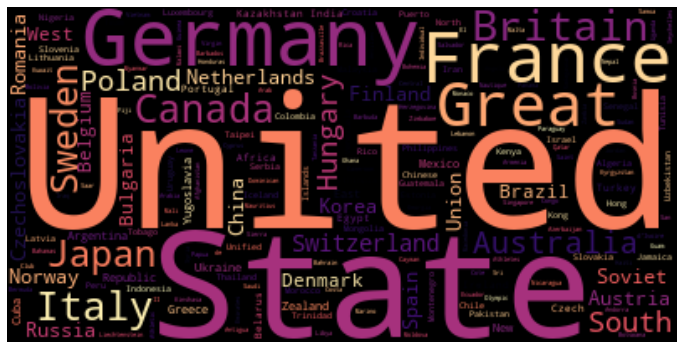

In [113]:
#join all the instances of all the teams into a single string and store it in the variable "countries".
countries=" ".join(n for n in olympics["Team"])
from wordcloud import WordCloud
plt.figure(figsize=(12, 11))
wc = WordCloud(background_color='black',colormap='magma',collocations=False).generate(countries)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [21]:
top10=olympics["Team"].value_counts().sort_values(ascending=False).head(10)
top10

United States    17598
France           11817
Great Britain    11264
Italy            10212
Germany           9230
Canada            9226
Japan             8269
Sweden            8004
Australia         7512
Hungary           6492
Name: Team, dtype: int64

From the above Word Cloud, we can conclude that the countries with maximum partricipation are United States, France, Britain, Italy and Germany.

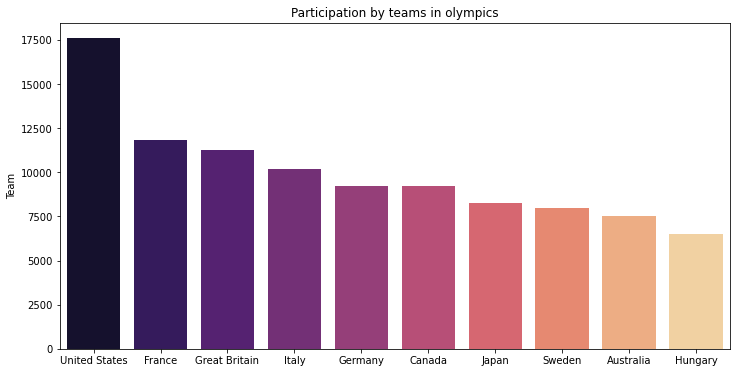

In [101]:
#To verify the top 10 participating countries
sns.set_palette("magma",10)
plt.figure(figsize=(12,6))
plt.title("Participation by teams in olympics")
sns.barplot(x=top10.index,y=top10);

### 7. Countries with most number of Gold Medals 

In [23]:
gold_countries= olympics[olympics['Medal']=='Gold'].groupby(['Team']).count().sort_values(by='ID',ascending=False).reset_index()
gold_countries.head(10).style.background_gradient(cmap="Purples",axis=0)

,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal
0,United States,2474,2474,2474,2474,2474,2474,2474,2474,2474,2474,2474,2474,2474,2474
1,Soviet Union,1058,1058,1058,1058,1058,1058,1058,1058,1058,1058,1058,1058,1058,1058
2,Germany,679,679,679,679,679,679,679,679,679,679,679,679,679,679
3,Italy,535,535,535,535,535,535,535,535,535,535,535,535,535,535
4,Great Britain,519,519,519,519,519,519,519,519,519,519,519,519,519,519
5,France,455,455,455,455,455,455,455,455,455,455,455,455,455,455
6,Sweden,451,451,451,451,451,451,451,451,451,451,451,451,451,451
7,Hungary,432,432,432,432,432,432,432,432,432,432,432,432,432,432
8,Canada,422,422,422,422,422,422,422,422,422,422,422,422,422,422
9,East Germany,369,369,369,369,369,369,369,369,369,369,369,369,369,369


In [97]:
gold_plot = px.pie(gold_countries.head(10), values='ID',hole=0.6, names='Team', title='<b>Top 10 Gold Winning Nations</b>',color_discrete_sequence=px.colors.sequential.Magma)
gold_plot.show()

### 8. Participation of Male and Female athletes over the years

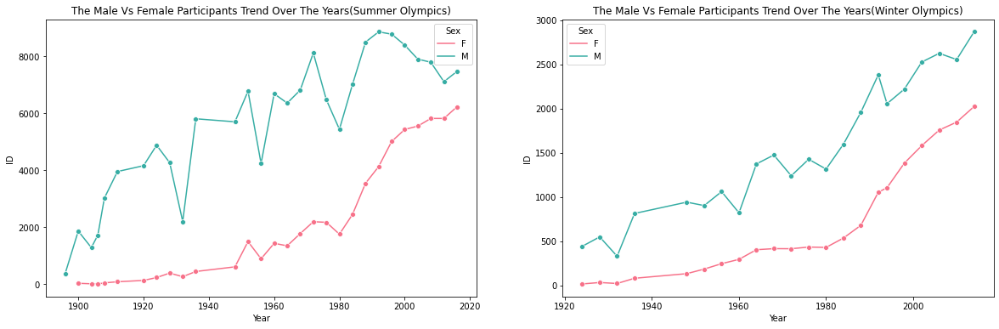

In [25]:
summer_oly=olympics[olympics['Season']=="Summer"]
gender_s=summer_oly.groupby(['Sex','Year']).count().reset_index()

winter_oly=olympics[olympics['Season']=='Winter']
gender_w=winter_oly.groupby(['Sex','Year']).count().reset_index()

sns.set_palette("magma",1)

fig, axs = plt.subplots(1, 2,figsize=(20, 6))
sns.lineplot(data=gender_s,x="Year",y="ID",hue='Sex',ax=axs[0],marker='o').set_title('The Male Vs Female Participants Trend Over The Years(Summer Olympics)')
sns.lineplot(data=gender_w,x="Year",y="ID",hue='Sex',ax=axs[1],marker='o').set_title('The Male Vs Female Participants Trend Over The Years(Winter Olympics)')
plt.show()

The observations that can be made from the above graphs are:
- The Summer Olympics has more participants compared to winter olympics
- In both the seasons, the participation of male and female have increased over the years
- There are sharp declines of participants in the years 1932, 1956 and 1980 which can be attributed to the Great Depression, Boycott by China and boycott by USA respectively

In [26]:
gender_p=olympics.groupby(['Sex','Year']).count().reset_index()

line_colors = ["#C20078",'#7BC8F6']
gender_plot=px.line(gender_p,x="Year",y="ID",color="Sex", markers=True, color_discrete_sequence=line_colors,template="none")
gender_plot.update_layout(plot_bgcolor = "whitesmoke",
    title="<b>The Male Vs Female Participants Trend Over The Years</b>",
    yaxis_title="Number Of Participants")
gender_plot.show()

The above graph shows an almost steady trend with 3 sharp declines as mentioned above. After 1992, there is a pattern of uptrend and downtrend. This is because till 1992, summer and winter olympics used to be conducted in the same year. But thereafter,there's a four year cycle in alternating even numbered years. 

### 9. Relationship between height and weight in different Sports

In [27]:
plot = px.scatter(olympics, x="Height", y="Weight",size = "Age", color='Sport',title="<b>Variation Of Height Vs Weight Vs Age Across Sports</b>")
plot.update_layout(plot_bgcolor = "Black",autosize=True)
plot.show()

Observations:
We can see that Height and the Weight of the participants follows a trend wherein the the sports of Weightlifiting and Basketball have higher ratios while other sports such as Gymnastics and Rhythmic Gymnastics have lower ratios. This trend can be explained by the fact that; *both the latter described sports are majorly female dominated.**

In [28]:
k=olympics[olympics['Weight']==214]
k

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
23155,12177,"Ricardo Blas, Jr.",M,21.0,183.0,214.0,Guam,GUM,2008 Summer,2008,Summer,Beijing,Judo,Judo Men's Heavyweight,No Medal
23156,12177,"Ricardo Blas, Jr.",M,25.0,183.0,214.0,Guam,GUM,2012 Summer,2012,Summer,London,Judo,Judo Men's Heavyweight,No Medal


### 10. Top 3 male athletes with most number of medals

In [120]:
topmale_df= olympics[(olympics['Medal']=="Gold")|(olympics['Medal']=="Silver")|(olympics['Sex']=="M")& (olympics['Medal']=="Bronze")].groupby(['Name',"Team","Sport"]).count().sort_values(by="ID",ascending=False).reset_index()
topmale_df.head(5).style.background_gradient(cmap='Purples',axis=0)

,Name,Team,Sport,ID,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Event,Medal
0,"Michael Fred Phelps, II",United States,Swimming,28,28,28,28,28,28,28,28,28,28,28,28
1,Nikolay Yefimovich Andrianov,Soviet Union,Gymnastics,15,15,15,15,15,15,15,15,15,15,15,15
2,Larysa Semenivna Latynina (Diriy-),Soviet Union,Gymnastics,14,14,14,14,14,14,14,14,14,14,14,14
3,Borys Anfiyanovych Shakhlin,Soviet Union,Gymnastics,13,13,13,13,13,13,13,13,13,13,13,13
4,Takashi Ono,Japan,Gymnastics,13,13,13,13,13,13,13,13,13,13,13,13


In [136]:
top_male_data = dict(
    name=["Michael Phelps", "Nikolay Andrianov", "Borys Shakhlin",'Takashi Ono','Edoardo Mangiarotti'],
    country=["USA","Soviet Union","Soviet Union","Japan","Italy"],
    sport=["Swimming", "Gymnastics", "Gymnastics", "Gymnastics", "Fencing"],
    value=[28, 15, 13, 13, 13])

In [139]:
fig = px.treemap(top_male_data, path=['sport', 'country','name'], values='value', color='value',color_continuous_scale='magma',color_continuous_midpoint=np.average(top_male_data['value']), hover_data=['sport'])
fig.update_traces(root_color="gray")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=50))
print()

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [140]:
fig.show()

- The top 3 male performers are namely Michael Phelps(USA), Nikolay Andrianov (Soviet Union) and Borys Shakhlin (Soviet Union) respectively.
- While the latter two athletes belonged to the era of the cold-war, Michael Phillips is an athlete who contested in the recent years post the collapse of the Soviet Union.
- It is quite amazing that these athletes have individuallly won more medals than many countries like Indonesia, Nepal, India, and most of the African and South American Nations.

### 11. Top 3 female athletes with most number of medals

In [123]:
top_female_df= olympics[(olympics['Medal']=="Gold")|(olympics['Medal']=="Silver")|(olympics['Sex']!="F")& (olympics['Medal']=="Bronze")].groupby(['Name',"Team","Sport"]).count().sort_values(by="ID",ascending=False).reset_index()
top_female_df.head(5).style.background_gradient(cmap='Purples',axis=0)

,Name,Team,Sport,ID,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Event,Medal
0,"Michael Fred Phelps, II",United States,Swimming,28,28,28,28,28,28,28,28,28,28,28,28
1,Nikolay Yefimovich Andrianov,Soviet Union,Gymnastics,15,15,15,15,15,15,15,15,15,15,15,15
2,Larysa Semenivna Latynina (Diriy-),Soviet Union,Gymnastics,14,14,14,14,14,14,14,14,14,14,14,14
3,Borys Anfiyanovych Shakhlin,Soviet Union,Gymnastics,13,13,13,13,13,13,13,13,13,13,13,13
4,Takashi Ono,Japan,Gymnastics,13,13,13,13,13,13,13,13,13,13,13,13


In [124]:
top_female_data = dict(
    name=["Larysa Semenivna Latynina", "Jennifer Elisabeth Thompson", "Dara Grace Torres",'Natalie Anne','Birgit Fischer'],
    sport=["Gymnastics", "Swimming", "Swimming", "Swimming","Gymnastics"],
    country=["Soviet Union", "United States", "United States", "United States","Czechoslovakia"],
    value=[18, 12, 12, 12, 11])

In [125]:
fig = px.treemap(top_female_data, path=['sport', 'country','name'], values='value', color='value',color_continuous_scale='magma',color_continuous_midpoint=np.average(top_male_data['value']), hover_data=['sport'],)
fig.update_traces(root_color="blue")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Prath\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



- The top 3 female performers are namely Larissa Semyonovna (Soviet Union),Jennifer Elisabeth Thompson (USA) and Dara Grace Torres (USA) respectively.
- Similar to their male counterparts, these athletes too have individually won more medals than most of the developing nations like Indonesia, Nepal, India, and most of the African and South American Nations.

# Conclusion 

We have analysed the 120 years olympics dataset and drawn various inferences. We have performed data cleaning and analysed the performance of all countries giving specific importance to India. The participation over the years in Summer and Winter Olympics is studied separately and when studied together we realised that after 1992, summer and  winter olympics are not being conducted in the same year. Different attributes are taken into consideration and their relationship is being studied. 